# 1. Dataset:

In [157]:
!pip install fairlearn

In [158]:
!pip install lime

In [159]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from fairlearn.metrics import demographic_parity_difference, equalized_odds_difference
from fairlearn.metrics import MetricFrame, true_positive_rate, false_positive_rate


from lime.lime_text import LimeTextExplainer

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


In [160]:
df = pd.read_csv('data.csv')
df

,Age,Gender,EducationLevel,ExperienceYears,PreviousCompanies,DistanceFromCompany,InterviewScore,SkillScore,PersonalityScore,RecruitmentStrategy,HiringDecision
0,26,1,2,0,3,26.783828,48,78,91,1,1
1,39,1,4,12,3,25.862694,35,68,80,2,1
2,48,0,2,3,2,9.920805,20,67,13,2,0
3,34,1,2,5,2,6.407751,36,27,70,3,0
4,30,0,1,6,1,43.105343,23,52,85,2,0
...,...,...,...,...,...,...,...,...,...,...,...
1495,48,0,2,3,4,9.183783,66,3,80,3,1
1496,27,1,2,10,3,14.847731,43,97,7,2,0
1497,24,1,1,1,2,4.289911,31,91,58,1,1
1498,48,0,2,4,4,36.299263,9,37,44,2,1


**Exploratory data analysis**

In [161]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1500 entries, 0 to 1499
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Age                  1500 non-null   int64  
 1   Gender               1500 non-null   int64  
 2   EducationLevel       1500 non-null   int64  
 3   ExperienceYears      1500 non-null   int64  
 4   PreviousCompanies    1500 non-null   int64  
 5   DistanceFromCompany  1500 non-null   float64
 6   InterviewScore       1500 non-null   int64  
 7   SkillScore           1500 non-null   int64  
 8   PersonalityScore     1500 non-null   int64  
 9   RecruitmentStrategy  1500 non-null   int64  
 10  HiringDecision       1500 non-null   int64  
dtypes: float64(1), int64(10)
memory usage: 129.0 KB


In [162]:
print(df.describe())

               Age       Gender  EducationLevel  ExperienceYears  \
count  1500.000000  1500.000000     1500.000000      1500.000000   
mean     35.148667     0.492000        2.188000         7.694000   
std       9.252728     0.500103        0.862449         4.641414   
min      20.000000     0.000000        1.000000         0.000000   
25%      27.000000     0.000000        2.000000         4.000000   
50%      35.000000     0.000000        2.000000         8.000000   
75%      43.000000     1.000000        3.000000        12.000000   
max      50.000000     1.000000        4.000000        15.000000   

       PreviousCompanies  DistanceFromCompany  InterviewScore   SkillScore  \
count         1500.00000          1500.000000     1500.000000  1500.000000   
mean             3.00200            25.505379       50.564000    51.116000   
std              1.41067            14.567151       28.626215    29.353563   
min              1.00000             1.031376        0.000000     0.000000 

In [163]:
df.isnull().sum()

,0
Age,0
Gender,0
EducationLevel,0
ExperienceYears,0
PreviousCompanies,0
DistanceFromCompany,0
InterviewScore,0
SkillScore,0
PersonalityScore,0
RecruitmentStrategy,0


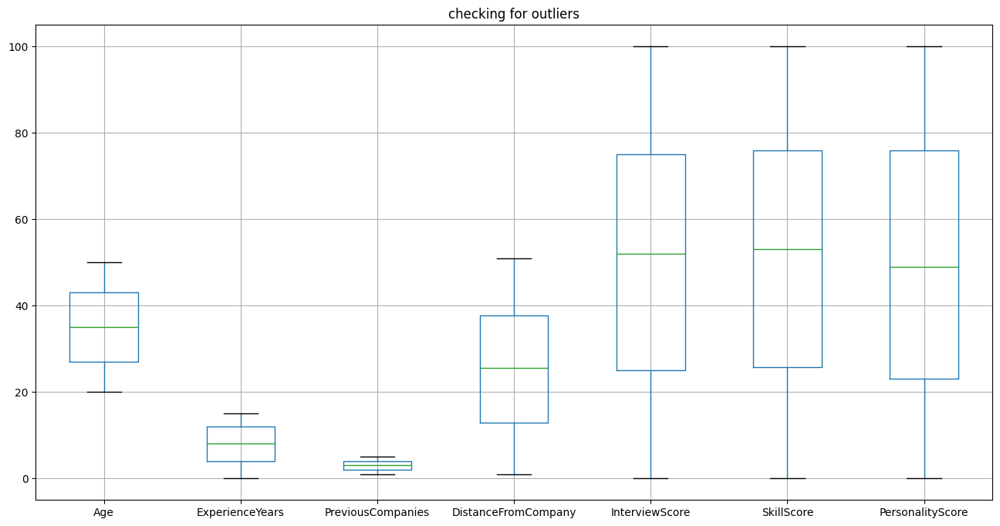

In [164]:
columns1= ['Age','ExperienceYears','PreviousCompanies', 'DistanceFromCompany','InterviewScore', 'SkillScore', 'PersonalityScore']
plt.figure(figsize=(16, 8))
df[columns1].boxplot()
plt.title('checking for outliers')
plt.show()

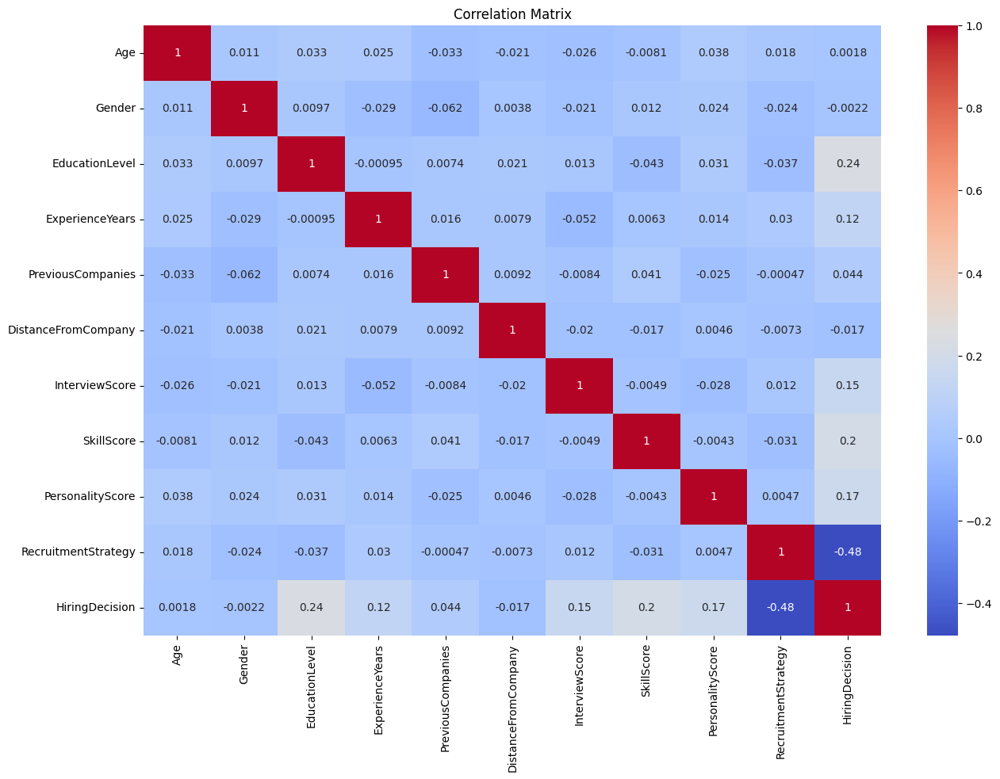

In [165]:
plt.figure(figsize=(15, 10))
corr = df.corr(numeric_only=True)
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

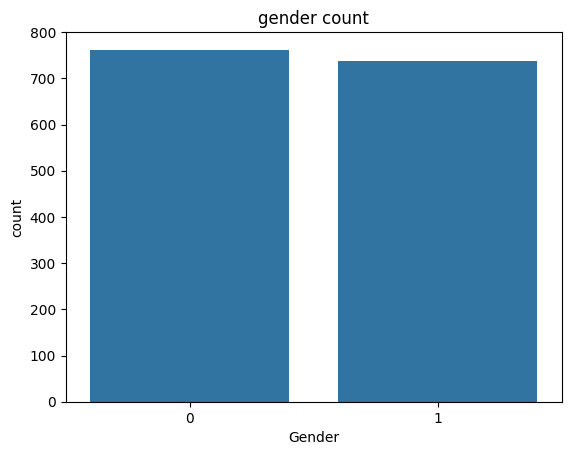

In [166]:
sns.countplot(x='Gender', data=df)
plt.title('gender count')
plt.show()


In [167]:
df['HiringDecision'].value_counts(normalize=True)

,proportion
HiringDecision,
0,0.69
1,0.31


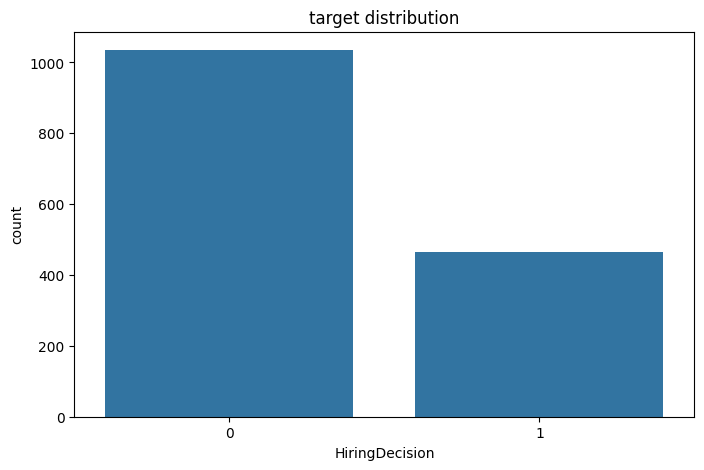

In [168]:
plt.figure(figsize=(8, 5))
sns.countplot(x='HiringDecision', data=df)
plt.title('target distribution')
plt.ylabel('count')
plt.show()


Feature Engineering

In [170]:
df['text'] = ("the candidate is " + df['Age'].astype(str) + " years old, gender " + df['Gender'].astype(str) + ", education level " + df['EducationLevel'].astype(str) + ", experience " +
      df['ExperienceYears'].astype(str) + " years" +", interview score " + df['InterviewScore'].astype(str) + ", skill score " + df['SkillScore'].astype(str) +
      ", personality score " + df['PersonalityScore'].astype(str))

pd.set_option('display.max_colwidth', None)

df['text']

,text
0,"the candidate is 26 years old, gender 1, education level 2, experience 0 years, interview score 48, skill score 78, personality score 91"
1,"the candidate is 39 years old, gender 1, education level 4, experience 12 years, interview score 35, skill score 68, personality score 80"
2,"the candidate is 48 years old, gender 0, education level 2, experience 3 years, interview score 20, skill score 67, personality score 13"
3,"the candidate is 34 years old, gender 1, education level 2, experience 5 years, interview score 36, skill score 27, personality score 70"
4,"the candidate is 30 years old, gender 0, education level 1, experience 6 years, interview score 23, skill score 52, personality score 85"
...,...
1495,"the candidate is 48 years old, gender 0, education level 2, experience 3 years, interview score 66, skill score 3, personality score 80"
1496,"the candidate is 27 years old, gender 1, education level 2, experience 10 years, interview score 43, skill score 97, personality score 7"
1497,"the candidate is 24 years old, gender 1, education level 1, experience 1 years, interview score 31, skill score 91, personality score 58"
1498,"the candidate is 48 years old, gender 0, education level 2, experience 4 years, interview score 9, skill score 37, personality score 44"


# 2. Train a Classifier

In [181]:
males = df[df['Gender']== 1]
females= df[df['Gender'] == 0]
# Split across training and test sets with representation imbalance (more male resumes in training).
trainm,testm = train_test_split(males, test_size=0.2, random_state=42)
trainf ,testf= train_test_split(females, test_size=0.8, random_state=42)

train = pd.concat([trainm, trainf])
test = pd.concat([testm, testf])

In [182]:
# Use text classification model ( IF-IDF + Logistic Regression).
vectorizer = TfidfVectorizer()
X_train = vectorizer.fit_transform(train['text'])
X_test = vectorizer.transform(test['text'])

model = LogisticRegression(max_iter=1000)
model.fit(X_train, train["HiringDecision"])# Train binary classifier: Hire vs. Not Hire

print("train accuracy= ", model.score(X_train, train["HiringDecision"]))
print("test accuracy= ", model.score(X_test, test["HiringDecision"]))

train accuracy=  0.7304582210242587
test accuracy=  0.6860158311345647


# 3. Bias Detection &amp; Measurement

In [183]:
y_test = test["HiringDecision"]
y_pred = model.predict(X_test)
metrics= MetricFrame(metrics={'trp': true_positive_rate,'fpr': false_positive_rate},y_true=y_test,
    y_pred=y_pred,sensitive_features=test['Gender'])

diff1 = abs(metrics.by_group['trp'][1]- metrics.by_group['trp'][0])
diff2= abs(metrics.by_group['fpr'][1] -metrics.by_group['fpr'][0])


In [184]:
y_test = test["HiringDecision"]
y_pred = model.predict(X_test)
print("_________________________Bias Metrics:_________________________")
print("demographic parity difference:", demographic_parity_difference(y_test, y_pred, sensitive_features=test["Gender"]))
print("equal opportunity difference:", equalized_odds_difference(y_test, y_pred, sensitive_features=test["Gender"]))

print("average odds difference:", 0.5 * (diff1 + diff2))

_________________________Bias Metrics:_________________________
demographic parity difference: 0.023504652193176788
equal opportunity difference: 0.03687083080654942
average odds difference: 0.02246297237200815


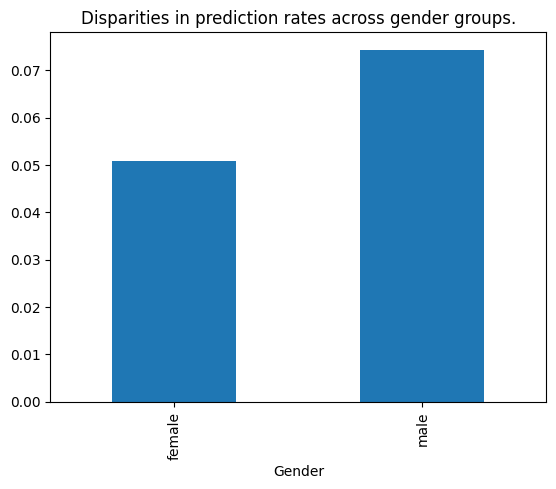

In [175]:
test['pred'] = model.predict(X_test)

test.groupby("Gender")["pred"].mean().plot(kind="bar", title="Disparities in prediction rates across gender groups.")
plt.xticks([0, 1], ["female", "male"])
plt.show()

# 4. Explainability &amp; Bias Attribution

In [176]:
hired = test[test['pred'] == 1].sample(3)
nothired = test[test['pred'] == 0].sample(2)
samples = pd.concat([hired, nothired])



In [177]:
lime_explainer = LimeTextExplainer()
for i in range(5):
    print("\n\n Sample ",i+1)
    lime=lime_explainer.explain_instance(samples.iloc[i]['text'],lambda x: model.predict_proba(vectorizer.transform(x)))
    lime.show_in_notebook()




 Sample  1




 Sample  2




 Sample  3




 Sample  4




 Sample  5


# 5. Bias Mitigation:

In [206]:
features= ['EducationLevel','ExperienceYears','InterviewScore','SkillScore', 'PersonalityScore']
X_train= train[features]
y_train= train['HiringDecision']
X_test =test[features]
group_counts = train.groupby(['Gender','HiringDecision']).size()
all_counts= train['HiringDecision'].value_counts()
weights =[]
for i in range(len(train)):
    gender = train.iloc[i]['Gender']
    outcome = train.iloc[i]['HiringDecision']
    all_count =all_counts[outcome]
    groupcount= group_counts[(gender, outcome)]
    weight =all_count/groupcount
    weights.append(weight)

improvedmodel= LogisticRegression(max_iter=1000)
improvedmodel.fit(X_train, y_train, sample_weight=weights)
test['pred2'] = improvedmodel.predict(X_test)


In [207]:
print("original model data:\n accuracy=", accuracy_score(test['HiringDecision'], test['pred']))
print("Male Hire Rate:", test[test['Gender'] == 1]['pred'].mean())
print("Female Hire Rate:", test[test['Gender'] == 0]['pred'].mean())
print("\nReweighted Model\n Accuracy:", accuracy_score(test['HiringDecision'], test['pred2']))
print("Male Hire Rate:", test[test['Gender'] ==1]['pred2'].mean())
print("Female Hire Rate:", test[test['Gender']== 0]['pred2'].mean())

original model data:
 accuracy= 0.6754617414248021
Male Hire Rate: 0.16891891891891891
Female Hire Rate: 0.11311475409836065

Reweighted Model
 Accuracy: 0.7203166226912929
Male Hire Rate: 0.20945945945945946
Female Hire Rate: 0.20491803278688525


In [208]:
originalgap=abs(test[test['Gender'] == 1]['pred'].mean() - test[test['Gender'] == 0]['pred'].mean())
improvedgap=abs(test[test['Gender'] == 1]['pred2'].mean() - test[test['Gender'] == 0]['pred2'].mean())
print("original gap:",originalgap)
print("improved gap:" ,improvedgap)

original gap: 0.055804164820558264
improved gap: 0.004541426672574206


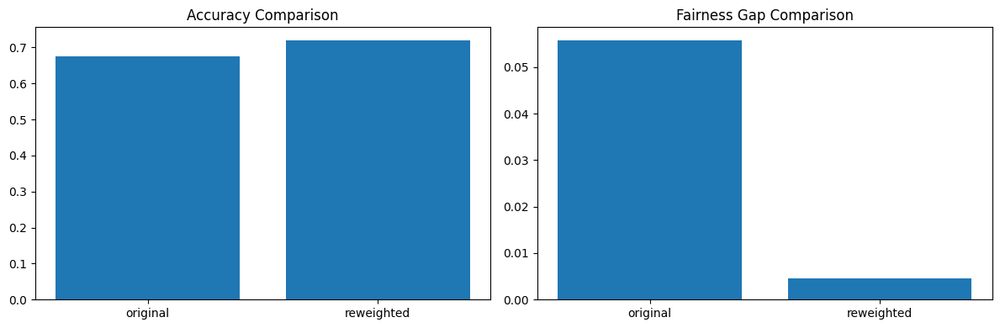

In [209]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
ax1.bar(['original', 'reweighted'], [accuracy_score(test['HiringDecision'], test['pred']),
    accuracy_score(test['HiringDecision'], test['pred2'])
])
ax1.set_title('Accuracy Comparison')
ax2.bar(['original', 'reweighted'], [abs(test[test['Gender'] == 1]['pred'].mean() - test[test['Gender'] == 0]['pred'].mean()),
    abs(test[test['Gender'] == 1]['pred2'].mean() - test[test['Gender'] == 0]['pred2'].mean())])
ax2.set_title('Fairness Gap Comparison')

plt.tight_layout()
plt.show()